In [1]:
%display plain
#%display latex

In [2]:
from matplotlib import cm
import numpy as np
import itertools
from itertools import combinations
from __future__ import print_function

In [3]:
real_vars = var('r,t,theta,phi,x,y,z')
for rv in real_vars:
    assume(rv, 'real')

In [4]:
xs = var(['x{}'.format(n) for n in range(4)])
for xi in xs: assume(xi,'real')

ys = var(['y{}'.format(n) for n in range(3)])
for yi in ys: assume(yi,'real')
    
xs, ys

((x0, x1, x2, x3), (y0, y1, y2))

In [5]:
p1 = sum([xi   for xi in xs])
p2 = sum([xi^2 for xi in xs])
p3 = sum([xi^3 for xi in xs])
p4 = sum([xi^4 for xi in xs])

p1, p2, p3, p4

(x0 + x1 + x2 + x3,
 x0^2 + x1^2 + x2^2 + x3^2,
 x0^3 + x1^3 + x2^3 + x3^3,
 x0^4 + x1^4 + x2^4 + x3^4)

In [6]:
e1 = sum([ xi          for (xi,        ) in combinations(xs,1)])
e2 = sum([ xi*xj       for (xi,xj      ) in combinations(xs,2)])
e3 = sum([ xi*xj*xk    for (xi,xj,xk   ) in combinations(xs,3)])
e4 = sum([ xi*xj*xk*xl for (xi,xj,xk,xl) in combinations(xs,4)])

e1, e2, e3, e4

(x0 + x1 + x2 + x3,
 x0*x1 + x0*x2 + x1*x2 + x0*x3 + x1*x3 + x2*x3,
 x0*x1*x2 + x0*x1*x3 + x0*x2*x3 + x1*x2*x3,
 x0*x1*x2*x3)

In [7]:
def inner_product(f,g,vrs):
    ip = (f.conjugate()*g).expand()*exp(-sum([vi^2 for vi in vrs]))/(2*pi)^len(vrs)
    # odd parts will integrate out, so remove them. makes this go quite a bit faster
    for vi in vrs:
        ip = ((ip+ip(vi=-vi))/2).simplify_full()
    for vi in vrs:
        ip = integrate(ip,vi,-oo,oo)
    return ip

In [8]:
com = vector([1,1,1,1])/sqrt(4) # center of mass

j1 = vector(QQ,[1,0,0,0])
j2 = vector(QQ,[0,1,0,0])
j3 = vector(QQ,[0,0,1,0])

j1 = j1 - (j1*com)*com/com.norm()^2
j2 = j2 - (j2*com)*com/com.norm()^2
j3 = j3 - (j3*com)*com/com.norm()^2

j2 = j2 - (j2*j1)*j1/j1.norm()^2
j3 = j3 - (j3*j1)*j1/j1.norm()^2

j3 = j3 - (j3*j2)*j2/j2.norm()^2

j1 = j1/j1.norm()
j2 = j2/j2.norm()
j3 = j3/j3.norm()

In [9]:
Pm = matrix([com,j1,j2,j3]).transpose()

Qm = matrix([[0,0,0],
             [1,0,0],
             [0,1,0],
             [0,0,1]])

In [10]:
M1 = matrix([[1,1,1,1],[1,-1,0,0],[0,1,-1,0]])
M2 = matrix([[1,1,1,1],[1,-1,0,0],[0,1,0,-1]])
M3 = matrix([[1,1,1,1],[1,0,-1,0],[0,0,1,-1]])
M4 = matrix([[1,1,1,1],[0,1,-1,0],[0,0,1,-1]])

Pl = matrix([j1,j2,j3]).transpose()

# the (4 choose 3) 3-body interations in 3 dimensions

tbi3_1 = (M1*Pl).right_kernel().basis_matrix()[0]
tbi3_2 = (M2*Pl).right_kernel().basis_matrix()[0]
tbi3_3 = (M3*Pl).right_kernel().basis_matrix()[0]
tbi3_4 = (M4*Pl).right_kernel().basis_matrix()[0]

tbi3_1 = (tbi3_1/tbi3_1.norm()).simplify_full()
tbi3_2 = (tbi3_2/tbi3_2.norm()).simplify_full()
tbi3_3 = (tbi3_3/tbi3_3.norm()).simplify_full()
tbi3_4 = (tbi3_4/tbi3_4.norm()).simplify_full()

tbi3s = tbi3_1, tbi3_2, tbi3_3, tbi3_4
signed_tbi3s = (tbi3_1, -tbi3_1,
                tbi3_2, -tbi3_2,
                tbi3_3, -tbi3_3,
                tbi3_4, -tbi3_4)
sym_tbi3s = tbi3_1, tbi3_2, tbi3_3, -tbi3_4

In [11]:
# the (4 choose 3) 3-body interations in 4 dimensions

tbi4_1 = M1.right_kernel().basis_matrix()[0]
tbi4_2 = M2.right_kernel().basis_matrix()[0]
tbi4_3 = M3.right_kernel().basis_matrix()[0]
tbi4_4 = M4.right_kernel().basis_matrix()[0]

tbi4_1 = (tbi4_1/tbi4_1.norm()).simplify_full()
tbi4_2 = (tbi4_2/tbi4_2.norm()).simplify_full()
tbi4_3 = (tbi4_3/tbi4_3.norm()).simplify_full()
tbi4_4 = (tbi4_4/tbi4_4.norm()).simplify_full()

for (tbi3, tbi4) in zip([tbi3_1, tbi3_2, tbi3_3, tbi3_4], [tbi4_1, tbi4_2, tbi4_3, tbi4_4]):
    assert tbi4 == (Pm*Qm*tbi3).simplify()

tbi4s = tbi4_1, tbi4_2, tbi4_3, tbi4_4
signed_tbi4s = (tbi4_1, -tbi4_1,
                tbi4_2, -tbi4_2,
                tbi4_3, -tbi4_3,
                tbi4_4, -tbi4_4)
sym_tbi4s = tbi4_1, tbi4_2, tbi4_3, -tbi4_4

In [12]:
f1 = e1(*(Pm*Qm*vector(ys))).simplify_full()
f2 = e2(*(Pm*Qm*vector(ys))).simplify_full()
f3 = e3(*(Pm*Qm*vector(ys))).simplify_full()
f4 = e4(*(Pm*Qm*vector(ys))).simplify_full()

f1, f2, f3, f4

(0,
 -1/2*y0^2 - 1/2*y1^2 - 1/2*y2^2,
 1/18*sqrt(3)*(sqrt(2)*y1^3 + 2*y0^3 - 3*y0*y1^2 - 3*(sqrt(2)*y1 + y0)*y2^2),
 -1/96*sqrt(2)*(sqrt(2)*y0^4 - 6*sqrt(2)*y0^2*y1^2 - 8*y0*y1^3 - 6*(sqrt(2)*y0^2 - 4*y0*y1)*y2^2))

In [13]:
P_threecurves = Graphics()

for (wi, wj) in [(-tbi3_1,-tbi3_2), 
                 (-tbi3_1,-tbi3_3),
                 (-tbi3_1, tbi3_4),
                 (-tbi3_2,-tbi3_3),
                 (-tbi3_2, tbi3_4),
                 (-tbi3_3, tbi3_4)]:
    three_curve = cos(t)*wi+sin(t)*wj
    three_curve = three_curve/three_curve.norm()
    P_threecurves += parametric_plot3d(three_curve,
                         (t,0,pi/2),
                         thickness=4,
                         color=rainbow(3)[0])
        
    P_threecurves += parametric_plot3d(three_curve,
                         (t,pi/2,pi),
                         thickness=4,
                         color=rainbow(3)[1])
        
    P_threecurves += parametric_plot3d(three_curve,
                         (t,pi,3*pi/2),
                         thickness=4,
                         color=rainbow(3)[2])
    
    P_threecurves += parametric_plot3d(three_curve,
                         (t,3*pi/2, 2*pi),
                         thickness=4,
                         color=rainbow(3)[1])
    
#P.show()

In [14]:
def stereographic_proj(v):
    """ Standard Stereographic projection with possible pre-rotation about X, Y and Z axis"""
    w = vector(v)
    return (w[0]/(1-w[2]),w[1]/(1-w[2]))

def to_iso_spherical_coords(v):
    x, y, z = v
    r = sqrt(x^2+y^2+z^2)
    theta = arccos(z/r)
    phi = atan2(y,x)
    return (r,theta,phi)

def to_iso_sphere_coords(v):
    r, theta, phi = to_iso_spherical_coords(v)
    return (phi, theta) #(theta, phi)

In [15]:
P_twocurves = Graphics()

var('t')

# the 2-interations
for (wi, wj) in [(-tbi3_1,-tbi3_2), 
                 (-tbi3_1,-tbi3_3),
                 (-tbi3_1, tbi3_4),
                 (-tbi3_2,-tbi3_3),
                 (-tbi3_2, tbi3_4),
                 (-tbi3_3, tbi3_4)]:
    three_curve = cos(t)*wi+sin(t)*wj
    three_curve = three_curve/three_curve.norm()
    #two_curve = vector(stereographic_proj(three_curve)).simplify()
    two_curve = vector(to_iso_sphere_coords(three_curve)).simplify()
    if (wi == -tbi3_1 or wi == -tbi3_2) and wj == -tbi3_3:
        P_twocurves += parametric_plot(two_curve,
                             (t,0,arctan(1/2)-1e-2),
                             thickness=2,
                             color=rainbow(3)[0])
        P_twocurves += parametric_plot(two_curve,
                             (t,arctan(1/2)+1e-2,pi/2),
                             thickness=2,
                             color=rainbow(3)[0])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,0,pi/2),
                             thickness=2,
                             color=rainbow(3)[0])
        
    if not( wi == -tbi3_1 and wj == -tbi3_2 ):
        P_twocurves += parametric_plot(two_curve,
                             (t,pi/2,pi),
                             thickness=2,
                             color=rainbow(3)[1])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,pi/2,3*pi/4-1e-2),
                             thickness=2,
                             color=rainbow(3)[1])
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/4+1e-2,pi),
                             thickness=2,
                             color=rainbow(3)[1])
        
    P_twocurves += parametric_plot(two_curve,
                         (t,pi,3*pi/2),
                         thickness=2,
                         color=rainbow(3)[2])
    if not( wi == -tbi3_1 and wj == -tbi3_2 ):
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/2+1e-3,2*pi-1e-3),
                             thickness=2,
                             color=rainbow(3)[1])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/2, 7*pi/4-1e-4),
                             thickness=2,
                             color=rainbow(3)[1])
        P_twocurves += parametric_plot(two_curve,
                             (t,7*pi/4+1e-4,2*pi),
                             thickness=2,
                             color=rainbow(3)[1])
    

for tbi3 in signed_tbi3s:   
    P_twocurves += point(to_iso_sphere_coords( tbi3), size=100, color='black')
    P_twocurves[-1].set_zorder(10)
    
#P_twocurves.show(aspect_ratio=1,axes=False)

In [16]:
def legendre_poly(n):
    return diff( (x^2-1)^n, x, n)/(2^n*factorial(n))

def assoc_legendre_poly(m,l):
    if m >= 0:
        return (-1)^m * (1-x^2)^(m/2) *diff(legendre_poly(l),x,m)
    else:
        return (-1)^m * factorial(l-m) /factorial(l+m) * assoc_legendre_poly(-m,l)

def real_sh(m,l):
    return r^(l)*cos(m*phi)*assoc_legendre_poly(m,l)(x=cos(theta))

def imag_sh(m,l):
    return r^(l)*sin(m*phi)*assoc_legendre_poly(m,l)(x=cos(theta))

def polar_to_euclid(f):
    return ( f(theta=arccos(y2/r)) )(r=sqrt(y0^2+y1^2+y2^2), phi=atan2(y1,y0))

def euclid_real(m,l):
    return polar_to_euclid(real_sh(m,l)).simplify()

def euclid_imag(m,l):
    return polar_to_euclid(imag_sh(m,l)).simplify()

In [17]:
def euclid_to_sphere(f):
    return f(y0=r*sin(theta)*cos(phi),y1=r*sin(theta)*sin(phi),y2=r*cos(theta))

In [18]:
sym_fn_3 = 0
ell = 3
for tbi4 in sym_tbi4s:
    sym_fn_3 += (r^ell*gegenbauer(ell,4/2-1,
                                  (tbi4/norm(tbi4))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
sym_fn_3.expand()

-8/3*sqrt(3)*x0^3 + 8/3*sqrt(3)*x0^2*x1 + 8/3*sqrt(3)*x0*x1^2 - 8/3*sqrt(3)*x1^3 + 8/3*sqrt(3)*x0^2*x2 - 16/3*sqrt(3)*x0*x1*x2 + 8/3*sqrt(3)*x1^2*x2 + 8/3*sqrt(3)*x0*x2^2 + 8/3*sqrt(3)*x1*x2^2 - 8/3*sqrt(3)*x2^3 + 8/3*sqrt(3)*x0^2*x3 - 16/3*sqrt(3)*x0*x1*x3 + 8/3*sqrt(3)*x1^2*x3 - 16/3*sqrt(3)*x0*x2*x3 - 16/3*sqrt(3)*x1*x2*x3 + 8/3*sqrt(3)*x2^2*x3 + 8/3*sqrt(3)*x0*x3^2 + 8/3*sqrt(3)*x1*x3^2 + 8/3*sqrt(3)*x2*x3^2 - 8/3*sqrt(3)*x3^3

In [19]:
# check symmetry
pretty_print( (sym_fn_3(x0=x1,x1=x0)-sym_fn_3).expand() )
pretty_print( (sym_fn_3(x0=x2,x2=x0)-sym_fn_3).expand() )
pretty_print( (sym_fn_3(x0=x3,x3=x0)-sym_fn_3).expand() )

0

0

0

In [20]:
for tbi4 in signed_tbi4s:
    pretty_print( sym_fn_3(x0=t*tbi4[0],x1=t*tbi4[1],x2=t*tbi4[2],x3=t*tbi4[3]))

64/9*t^3

-64/9*t^3

64/9*t^3

-64/9*t^3

64/9*t^3

-64/9*t^3

-64/9*t^3

64/9*t^3

In [21]:
sym_fn_4 = 0
ell = 4
for tbi4 in sym_tbi4s:
    sym_fn_4 += (r^ell*gegenbauer(ell,4/2-1,
                                  (tbi4/norm(tbi4))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
sym_fn_4.expand()

4/3*x0^4 - 40/9*x0^3*x1 - 8/3*x0^2*x1^2 - 40/9*x0*x1^3 + 4/3*x1^4 - 40/9*x0^3*x2 + 40/3*x0^2*x1*x2 + 40/3*x0*x1^2*x2 - 40/9*x1^3*x2 - 8/3*x0^2*x2^2 + 40/3*x0*x1*x2^2 - 8/3*x1^2*x2^2 - 40/9*x0*x2^3 - 40/9*x1*x2^3 + 4/3*x2^4 - 40/9*x0^3*x3 + 40/3*x0^2*x1*x3 + 40/3*x0*x1^2*x3 - 40/9*x1^3*x3 + 40/3*x0^2*x2*x3 - 32*x0*x1*x2*x3 + 40/3*x1^2*x2*x3 + 40/3*x0*x2^2*x3 + 40/3*x1*x2^2*x3 - 40/9*x2^3*x3 - 8/3*x0^2*x3^2 + 40/3*x0*x1*x3^2 - 8/3*x1^2*x3^2 + 40/3*x0*x2*x3^2 + 40/3*x1*x2*x3^2 - 8/3*x2^2*x3^2 - 40/9*x0*x3^3 - 40/9*x1*x3^3 - 40/9*x2*x3^3 + 4/3*x3^4

In [22]:
pretty_print( (sym_fn_4(x0=x1,x1=x0)-sym_fn_4).expand() )
pretty_print( (sym_fn_4(x0=x2,x2=x0)-sym_fn_4).expand() )
pretty_print( (sym_fn_4(x0=x3,x3=x0)-sym_fn_4).expand() )

0

0

0

In [23]:
for tbi4 in signed_tbi4s:
    pretty_print( sym_fn_4(x0=t*tbi4[0],x1=t*tbi4[1],x2=t*tbi4[2],x3=t*tbi4[3]) )

124/27*t^4

124/27*t^4

124/27*t^4

124/27*t^4

124/27*t^4

124/27*t^4

124/27*t^4

124/27*t^4

In [24]:
sym_fn_12 = 0
ell = 12
for tbi4 in sym_tbi4s:
    sym_fn_12 += (r^ell*gegenbauer(ell,4/2-1,
                                   (tbi4/norm(tbi4))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
#sym_fn_12.expand()

In [25]:
pretty_print( (sym_fn_12(x0=x1,x1=x0)-sym_fn_12).expand() )
pretty_print( (sym_fn_12(x0=x2,x2=x0)-sym_fn_12).expand() )
pretty_print( (sym_fn_12(x0=x3,x3=x0)-sym_fn_12).expand() )

0

0

0

In [26]:
for tbi4 in signed_tbi4s:
    pretty_print( sym_fn_12(x0=t*tbi4[0],x1=t*tbi4[1],x2=t*tbi4[2],x3=t*tbi4[3]), end='  ' )

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

In [27]:
def rep_lap(f,k,vrs):
    if k <= 0:
        return f
    elif k == 1:
        return lap(f,vrs)
    else:
        return lap(rep_lap(f,k-1,vrs),vrs)
    
def semi_factorial(n):
    if n <= 1:
        return 1
    else:
        return n*semi_factorial(n-2)
    
def harmonic_leading_term(f,n,vrs):
    r_sq = sum([vi^2 for vi in vrs])
    d = len(vrs)
    return sum([ ((-1)^k)*semi_factorial(d+2*n-2*k-4) \
                / ( semi_factorial(2*k) * semi_factorial(d+2*n-4) ) \
                * (r_sq^k) * rep_lap(f,k,vrs) for k in range(floor(n/2)+1)])

In [28]:
def lap(f,vrs):
    return sum([diff(f,vi,2) for vi in vrs])

In [29]:
sym_fn_3_4 = harmonic_leading_term(sym_fn_3^4,12,xs).simplify().expand()
sym_fn_4_3 = harmonic_leading_term(sym_fn_4^3,12,xs).simplify().expand()

In [30]:
pretty_print( lap(sym_fn_3_4, xs).simplify_full() )
pretty_print( lap(sym_fn_4_3, xs).simplify_full() )

0

0

In [31]:
#sym_fn_12p = (((sym_fn_3^4)/(sym_fn_3^4)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])) - \
#              (sym_fn_4^3)/(sym_fn_4^3)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])).expand()

sym_fn_12p = (((sym_fn_3_4)/(sym_fn_3_4)(x0=tbi4_1[0],x1=tbi4_1[1],x2=tbi4_1[2],x3=tbi4_1[3])) - \
              (sym_fn_4_3)/(sym_fn_4_3)(x0=tbi4_1[0],x1=tbi4_1[1],x2=tbi4_1[2],x3=tbi4_1[3])).expand()


#sym_fn_12p

In [32]:
for tbi4 in signed_tbi4s:
    pretty_print( sym_fn_12p(x0=t*tbi4[0],x1=t*tbi4[1],x2=t*tbi4[2],x3=t*tbi4[3]), end=' ' )

0

0

0

0

0

0

0

0

In [33]:
lap(sym_fn_12p,xs).simplify()

0

In [34]:
wv = sym_fn_12p(*(Pm*Qm*vector(ys))).simplify_full().expand()

In [35]:
lap(wv,ys).simplify_full().expand()

3296305543680/6005211269*sqrt(2)*y0^7*y1^3 - 500362450560/6005211269*sqrt(2)*y0^5*y1^5 - 1639229195520/6005211269*sqrt(2)*y0^3*y1^7 + 1201537869440/6005211269*sqrt(2)*y0*y1^9 - 9888916631040/6005211269*sqrt(2)*y0^7*y1*y2^2 + 1000724901120/6005211269*sqrt(2)*y0^5*y1^3*y2^2 + 1639229195520/6005211269*sqrt(2)*y0^3*y1^5*y2^2 - 3128403041280/6005211269*sqrt(2)*y0*y1^7*y2^2 + 1501087351680/6005211269*sqrt(2)*y0^5*y1*y2^4 + 8196145977600/6005211269*sqrt(2)*y0^3*y1^3*y2^4 + 4261583934720/6005211269*sqrt(2)*y0*y1^5*y2^4 + 4917687586560/6005211269*sqrt(2)*y0^3*y1*y2^6 - 16216709376000/6005211269*sqrt(2)*y0*y1^3*y2^6 - 2561812594560/6005211269*sqrt(2)*y0*y1*y2^8 - 517980459520/6005211269*y0^10 + 107612997120/316063751*y0^8*y1^2 - 4567281989760/6005211269*y0^6*y1^4 + 520862032320/6005211269*y0^4*y1^6 - 2894382803520/6005211269*y0^2*y1^8 - 3878634240/316063751*y1^10 + 107612997120/316063751*y0^8*y2^2 - 9134563979520/6005211269*y0^6*y1^2*y2^2 + 19432183377600/6005211269*y0^4*y1^4*y2^2 + 302178806092

In [36]:
for tbi3 in signed_tbi3s:
    pretty_print( wv(y0=t*tbi3[0],y1=t*tbi3[1],y2=t*tbi3[2]) )

0

0

0

0

0

0

0

0

In [37]:
sphere_wv = euclid_to_sphere(wv).simplify_full()(r=1).simplify_full()

In [38]:
sphere_wv = sphere_wv/sqrt(integrate(integrate(sphere_wv^2,phi,-pi,pi)*sin(theta),theta,0,pi))

In [39]:
sqrt(integrate(integrate(sphere_wv^2,phi,-pi,pi)*sin(theta),theta,0,pi))

1

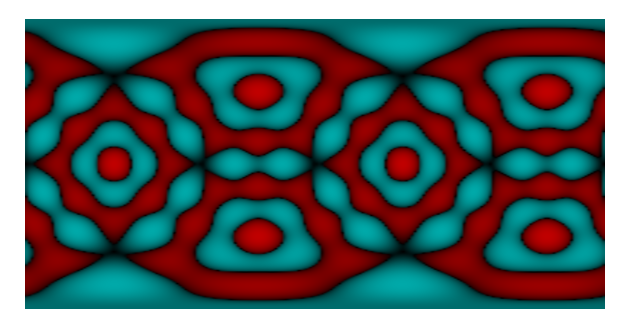

In [40]:
P_sphere_wv = complex_plot(lambda z: sphere_wv(theta=z.imag_part(),phi=z.real_part()),
                           (phi,-pi,pi), (theta,0,pi), # cmap=cm.viridis,
                           plot_points=200,aspect_ratio=1,axes=False)

P_sphere_wv.show()

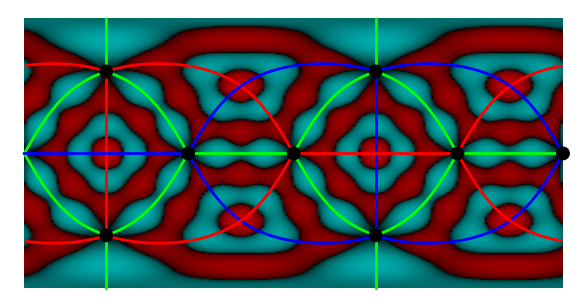

In [41]:
P_sphere_wv + P_twocurves

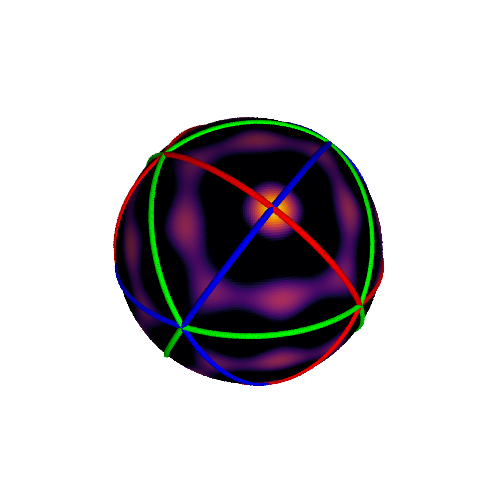

In [42]:
def cf(theta,phi): return float(sphere_wv(theta=theta,phi=phi))

osph = P_threecurves + parametric_plot3d( (sin(theta)*cos(phi),
                                           sin(theta)*sin(phi),
                                           cos(theta)),
                                         (theta,0,pi), (phi,-pi,pi), 
                                         color=(cf,cm.inferno), 
                                         plot_points=[200,400],
                                         frame=False)

osph.show(viewer='tachyon')

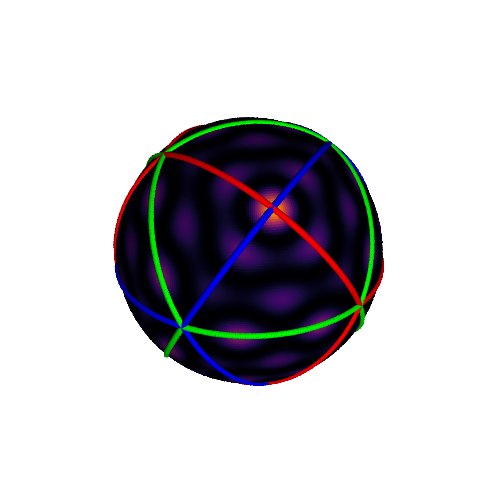

In [43]:
def cf(theta,phi): return float(sphere_wv(theta=theta,phi=phi)^2)

osph = P_threecurves + parametric_plot3d( (sin(theta)*cos(phi),
                                           sin(theta)*sin(phi),
                                           cos(theta)),
                                         (theta,0,pi), (phi,-pi,pi), 
                                         color=(cf,cm.inferno), 
                                         plot_points=[200,400],
                                         frame=False)

osph.show(viewer='tachyon')

In [44]:
mn = float('inf')
mx = float('-inf')
for th, fi in zip(np.linspace(0,N(pi),100),np.linspace(-N(pi),N(pi),200)):
    vl = N(sphere_wv(theta=th,phi=fi))
    mn = min(mn,vl)
    mx = max(mx,vl)
    
mn, mx    

(-0.465745330869942, 0.560934106141757)

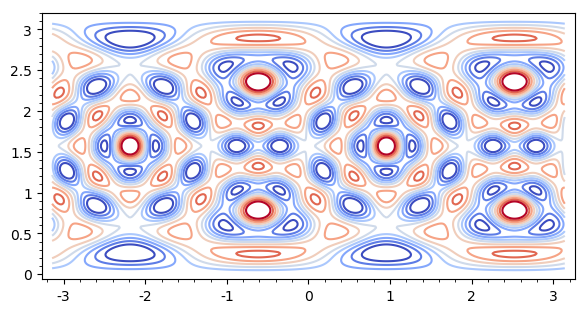

In [45]:
contours = set(list(np.linspace(mn+0.01,0,5))+list(np.linspace(0,mx-0.01,5)))
contours = list(contours)
contours.sort()

P_contours = contour_plot(sphere_wv, (phi,-pi,pi), (theta,0,pi), 
             cmap=cm.coolwarm,
             contours=contours,
             plot_points=[400,200],
             aspect_ratio=1,
             axes=False,
             fill=False)

P_contours

In [46]:
P_contours.save('contours.pdf')

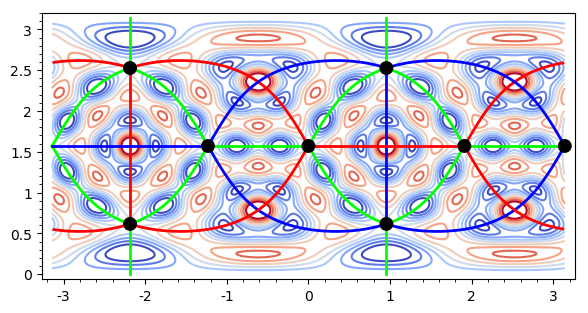

In [47]:
P_contours + P_twocurves

In [48]:
sphere_plot = spherical_plot3d((sphere_wv/(1+max(mx,abs(mn))))+1, 
                               (phi,-pi,pi), (theta,0,pi),
                               opacity=0.75,
                               plot_points=200,
                               aspect_ratio=1)
sphere_plot += implicit_plot3d(x^2+y^2+z^2==1,
                               (x,-1,1), (y,-1,1), (z,-1,1),
                               opacity=0.5,
                               color='red',
                               frame=False)
sphere_plot += P_threecurves
sphere_plot.show(viewer='threejs')

Graphics3d Object

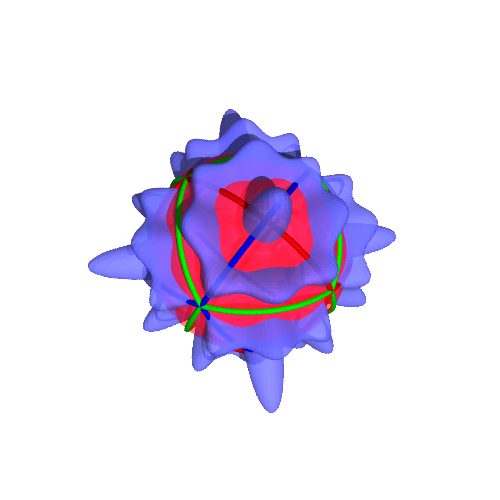

In [49]:
sphere_plot.show(viewer='tachyon')

In [50]:
prob_sphere_plot = spherical_plot3d((sphere_wv^2)/(0.1+max(mn^2,mx^2))+1,
                                    (phi,-pi,pi), (theta,0,pi),
                                    opacity=0.75,
                                    plot_points=200,
                                    aspect_ratio=1,
                                    frame=False)
#prob_sphere_plot += implicit_plot3d(x^2+y^2+z^2==1,
#                               (x,-1,1), (y,-1,1), (z,-1,1),
#                               opacity=0.5,
#                               color='red',
#                               frame=False)
prob_sphere_plot += P_threecurves
prob_sphere_plot.show(viewer='threejs')

Graphics3d Object

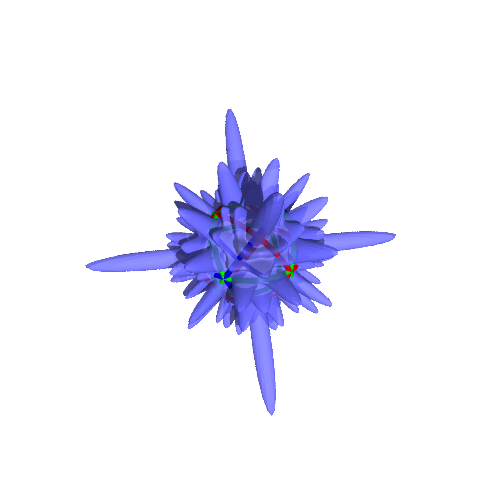

In [51]:
prob_sphere_plot.show(viewer='tachyon')

In [52]:
wavef4 = sym_fn_12p

In [53]:
print( (wavef4(x0=x1,x1=x0)-wavef4).expand() )
print( (wavef4(x0=x2,x2=x0)-wavef4).expand() )
print( (wavef4(x0=x3,x3=x0)-wavef4).expand() )

0
0
0


In [54]:
R.<x0,x1,x2,x3> = PolynomialRing(AA)
a_wavef4 = R(wavef4)
a_e1 = R(e1)
a_e2 = R(e2)
a_e3 = R(e3)
a_e4 = R(e4)
a_p1 = R(p1)
a_p2 = R(p2)
a_p3 = R(p3)
a_p4 = R(p4)

In [55]:
#S.<y0,y1,y2> = PolynomialRing(QQbar)
S.<y0,y1,y2> = PolynomialRing(SR)
a_wave3 = S(wv)
a_f2 = S(f2)
a_f3 = S(f3)
a_f4 = S(f4)

In [56]:
def get_monomials():
    powers = [(exp1,exp2,exp3,exp4)
              for exp1, exp2, exp3, exp4 in itertools.product(range(0,13),repeat=4)
              if 1*exp1 + 2*exp2 + 3*exp3 + 4*exp4 == 12]
    monomials = set()
    for (exp1,exp2,exp3,exp4) in powers:
        monomials = monomials.union((a_e1^exp1 * a_e2^exp2 * a_e3^exp3 * a_e4^exp4).dict().keys())
    monomials = list(monomials)
    monomials.sort()
    basis_dict = { mon: n for n, mon in enumerate(monomials)}
    rev_basis_dict = { n: mon for n, mon in enumerate(monomials)}
    return basis_dict, rev_basis_dict
    
basis_dict, rev_basis_dict = get_monomials()

In [57]:
def poly_to_vec(p):
    dp = p.dict()
    return vector([ dp[monomial] if monomial in dp else 0 for monomial in basis_dict.keys()])
        
def get_sym_matrix():
    powers = [(exp1,exp2,exp3,exp4) 
              for exp1, exp2, exp3, exp4 in itertools.product(range(0,13),repeat=4)
              if 1*exp1 + 2*exp2 + 3*exp3 + 4*exp4 == 12]
    return matrix([poly_to_vec(a_e1^exp1 * a_e2^exp2 * a_e3^exp3 * a_e4^exp4) 
                   for (exp1,exp2,exp3,exp4) in powers ])

print( get_sym_matrix().dimensions() )

mat = get_sym_matrix()

(34, 455)


In [58]:
v_wavef4 = poly_to_vec(a_wavef4)

In [59]:
efs = var(['ef{}'.format(n) for n in range(34)])

vefs = vector(efs)

In [60]:
import itertools
for eqn in zip(solve(list(vefs*mat - v_wavef4), list(efs))[0], 
               [(exp1,exp2,exp3,exp4) 
                for exp1, exp2, exp3, exp4 in itertools.product(range(0,13),repeat=4)
                if 1*exp1 + 2*exp2 + 3*exp3 + 4*exp4 == 12]):
    print(eqn)

(ef0 == (24914165760/71849), (0, 0, 0, 3))
(ef1 == (1149603840/83581), (0, 0, 4, 0))
(ef2 == (225245018972160/6005211269), (0, 1, 2, 1))
(ef3 == (-724225025064960/6005211269), (0, 2, 0, 2))
(ef4 == (3464918830080/6005211269), (0, 3, 2, 0))
(ef5 == (61560972840960/6005211269), (0, 4, 0, 1))
(ef6 == (-421869035520/6005211269), (0, 6, 0, 0))
(ef7 == (-18685624320/71849), (1, 0, 1, 2))
(ef8 == (-221507027343360/6005211269), (1, 1, 3, 0))
(ef9 == (136867493560320/6005211269), (1, 2, 1, 1))
(ef10 == (-18855162040320/6005211269), (1, 4, 1, 0))
(ef11 == (277818282086400/6005211269), (2, 0, 2, 1))
(ef12 == (870640321904640/6005211269), (2, 1, 0, 2))
(ef13 == (139473268485120/6005211269), (2, 2, 2, 0))
(ef14 == (-108777040081920/6005211269), (2, 3, 0, 1))
(ef15 == (4531103838720/6005211269), (2, 5, 0, 0))
(ef16 == (36917837890560/6005211269), (3, 0, 3, 0))
(ef17 == (-266386396723200/6005211269), (3, 1, 1, 1))
(ef18 == (-17767701780480/6005211269), (3, 3, 1, 0))
(ef19 == (-181056256266240/6005211

In [61]:
jacobi_wave4 = R(0)

for coeff, powers in zip(solve(list(vefs*mat - v_wavef4), list(efs))[0], 
               [(exp1,exp2,exp3,exp4) 
                for exp1, exp2, exp3, exp4 in itertools.product(range(0,13),repeat=4)
                if 1*exp1 + 2*exp2 + 3*exp3 + 4*exp4 == 12]):
    if powers[0] == 0:
        print(coeff,powers)
        jacobi_wave4 += coeff.rhs()*(a_e1^powers[0] * a_e2^powers[1] * a_e3^powers[2] * a_e4^powers[3] )

ef0 == (24914165760/71849) (0, 0, 0, 3)
ef1 == (1149603840/83581) (0, 0, 4, 0)
ef2 == (225245018972160/6005211269) (0, 1, 2, 1)
ef3 == (-724225025064960/6005211269) (0, 2, 0, 2)
ef4 == (3464918830080/6005211269) (0, 3, 2, 0)
ef5 == (61560972840960/6005211269) (0, 4, 0, 1)
ef6 == (-421869035520/6005211269) (0, 6, 0, 0)


In [62]:
jacobi_wave3 = jacobi_wave4(*(Pm*Qm*vector(ys))).simplify_full().expand()
assert jacobi_wave3 == wv

In [63]:
jacobi_wave3

1125111609280/6005211269*sqrt(2)*y0^9*y1^3 - 4856983145280/6005211269*sqrt(2)*y0^7*y1^5 + 5087323241280/6005211269*sqrt(2)*y0^5*y1^7 - 848504623680/6005211269*sqrt(2)*y0^3*y1^9 + 937335680/6005211269*sqrt(2)*y0*y1^11 - 3375334827840/6005211269*sqrt(2)*y0^9*y1*y2^2 + 9713966290560/6005211269*sqrt(2)*y0^7*y1^3*y2^2 - 5087323241280/6005211269*sqrt(2)*y0^5*y1^5*y2^2 - 21146680558080/6005211269*sqrt(2)*y0^3*y1^7*y2^2 + 3094729343360/6005211269*sqrt(2)*y0*y1^9*y2^2 + 14570949435840/6005211269*sqrt(2)*y0^7*y1*y2^4 - 25436616206400/6005211269*sqrt(2)*y0^5*y1^3*y2^4 + 82628856455040/6005211269*sqrt(2)*y0^3*y1^5*y2^4 - 8255736034560/6005211269*sqrt(2)*y0*y1^7*y2^4 - 15261969723840/6005211269*sqrt(2)*y0^5*y1*y2^6 - 37854955299840/6005211269*sqrt(2)*y0^3*y1^3*y2^6 - 4825688044800/6005211269*sqrt(2)*y0*y1^5*y2^6 + 9594407390400/6005211269*sqrt(2)*y0^3*y1*y2^8 + 5489763987840/6005211269*sqrt(2)*y0*y1^3*y2^8 - 1034076009600/6005211269*sqrt(2)*y0*y1*y2^10 - 129495114880/6005211269*y0^10*y1^2 + 8562004

In [64]:
s1 = matrix([[0,1,0,0],
             [1,0,0,0],
             [0,0,1,0],
             [0,0,0,1]])

s2 = matrix([[0,1,0,0],
             [0,0,1,0],
             [1,0,0,0],
             [0,0,0,1]])

s3 = matrix([[0,1,0,0],
             [0,0,1,0],
             [0,0,0,1],
             [1,0,0,0]])

refl = matrix([[-1, 0, 0, 0],
               [ 0,-1, 0, 0],
               [ 0, 0,-1, 0],
               [ 0, 0, 0,-1]])

S4 = [s1^i * s2^j * s3^k for (i,j,k) in itertools.product(range(2),range(3),range(4)) ]

In [65]:
s = SymmetricFunctions(QQ).s()

R(s([2,1,1]).expand(4))

x0^2*x1*x2 + x0*x1^2*x2 + x0*x1*x2^2 + x0^2*x1*x3 + x0*x1^2*x3 + x0^2*x2*x3 + 3*x0*x1*x2*x3 + x1^2*x2*x3 + x0*x2^2*x3 + x1*x2^2*x3 + x0*x1*x3^2 + x0*x2*x3^2 + x1*x2*x3^2

In [66]:
tableau_12 = [ (i,j,k,l) for (i,j,k,l) in itertools.product(range(13),repeat=4) if i >= j >= k >= l and i+j+k+l == 12 ]

shur_12 = [ s([i,j,k,l]) for (i,j,k,l) in tableau_12 ]

shur_12_polys = [ R(ess.expand(4)) for ess in shur_12 ]

In [67]:
monomials = set()
for p in shur_12_polys:
    monomials = monomials.union(p.dict().keys())
monomials = list(monomials)
monomials.sort()
basis_dict = {mon: n for (n,mon) in enumerate(monomials)}

def poly_to_vec(p):
    dp = p.dict()
    return vector([ dp[monomial] if monomial in dp else 0 for monomial in basis_dict.keys()])

mat = matrix([poly_to_vec(s) for s in shur_12_polys])
print(mat.dimensions())

v_wavef4 = poly_to_vec(a_wavef4)

efs = var(['ef{}'.format(n) for n in range(34)])
vefs = vector(efs)

(34, 455)


In [68]:
len(solve(list(vefs*mat - v_wavef4),list(efs) ))

1

In [69]:
for eqn in zip(solve(list(vefs*mat - v_wavef4), list(efs))[0],
               tableau_12):
    pretty_print(*eqn)

ef0 == (960226880127480/6005211269) (3, 3, 3, 3)

ef1 == (-435347030568600/6005211269) (4, 3, 3, 2)

ef2 == (-19555893639360/6005211269) (4, 4, 2, 2)

ef3 == (171351226077480/6005211269) (4, 4, 3, 1)

ef4 == (-3696365864520/6005211269) (4, 4, 4, 0)

ef5 == (222329494012860/6005211269) (5, 3, 2, 2)

ef6 == (-1628822711880/6005211269) (5, 3, 3, 1)

ef7 == (-869297663340/72351943) (5, 4, 2, 1)

ef8 == (-30675893607360/6005211269) (5, 4, 3, 0)

ef9 == (31635599606100/6005211269) (5, 5, 1, 1)

ef10 == (11572255890720/6005211269) (5, 5, 2, 0)

ef11 == (-127586038445100/6005211269) (6, 2, 2, 2)

ef12 == (4211007229440/6005211269) (6, 3, 2, 1)

ef13 == (16164040344840/6005211269) (6, 3, 3, 0)

ef14 == (-9115249315680/6005211269) (6, 4, 1, 1)

ef15 == (9788074857540/6005211269) (6, 4, 2, 0)

ef16 == (-6454806026580/6005211269) (6, 5, 1, 0)

ef17 == (883123278480/6005211269) (6, 6, 0, 0)

ef18 == (23878610339580/6005211269) (7, 2, 2, 1)

ef19 == (1302815325600/6005211269) (7, 3, 1, 1)

ef20 == (-10628999611020/6005211269) (7, 3, 2, 0)

ef21 == (4930049681280/6005211269) (7, 4, 1, 0)

ef22 == (87358554180/6005211269) (7, 5, 0, 0)

ef23 == (-4651100593020/6005211269) (8, 2, 1, 1)

ef24 == (2614752951840/6005211269) (8, 2, 2, 0)

ef25 == (-2917283580/316063751) (8, 3, 1, 0)

ef26 == (-883865704500/6005211269) (8, 4, 0, 0)

ef27 == (1886505314580/6005211269) (9, 1, 1, 1)

ef28 == (-930604766400/6005211269) (9, 2, 1, 0)

ef29 == (378515315880/6005211269) (9, 3, 0, 0)

ef30 == (169588997820/6005211269) (10, 1, 1, 0)

ef31 == (36991272600/6005211269) (10, 2, 0, 0)

ef32 == (-8974124820/6005211269) (11, 1, 0, 0)

ef33 == (-1218136860/6005211269) (12, 0, 0, 0)

In [ ]:
shur_12_polys_3 = [ S(ess(*(Pm*Qm*vector([y0,y1,y2])))) for ess in shur_12_polys ]

In [ ]:
shur_12_polys_3[0].dict()

In [ ]:
monomials = set()
for p in shur_12_polys_3:
    monomials = monomials.union(p.dict().keys())
monomials = list(monomials)
monomials.sort()
basis_dict = {mon: n for (n,mon) in enumerate(monomials)}

def poly_to_vec(p):
    p_dict = p.dict()
    return vector([ p_dict[monomial] if monomial in p_dict else 0 for monomial in monomials])

mat = matrix([poly_to_vec(s) for s in shur_12_polys_3])
print(mat.dimensions())

In [ ]:
a_wave3 = wavef4(*(Pm*Qm*vector(ys))).expand()
#a_wave3 = S(a_wave3)
a_wave3 = a_wave3.polynomial(SR)
v_wave3 = poly_to_vec(a_wave3)

In [ ]:
efs = var(['ef{}'.format(n) for n in range(34)])
vefs = vector(efs)

In [ ]:
eqns = [eqn for eqn in list(vefs*mat - v_wave3)]

In [ ]:
print( v_wave3[0] )

In [ ]:
print( eqns[0] )

In [ ]:
solve(list(vefs*mat - v_wave3), list(efs))

In [ ]:
for eqn in zip(solve(list(vefs*mat - v_wave3), list(efs))[0],
               tableau_12):
    pretty_print(*eqn)

In [ ]:
solution = solve(list(vefs*mat - v_wave3), list(efs))[0]

free_vars = set()
for line in solution:
    free_vars = free_vars.union(line.rhs().variables())
print(len(free_vars))
    
for line,tab in zip(solution, tableau_12):
    pretty_print( line({v:0 for v in line.rhs().variables()}), '\t', tab )

In [ ]:
x({x:0})